## 모델 다운로드

In [1]:
%cd /content
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -qr requirements.txt

import torch
from IPython.display import Image, clear_output

/content
Cloning into 'yolov5'...
remote: Enumerating objects: 15594, done.
remote: Counting objects: 100% (201/201), done.
remote: Compressing objects: 100% (148/148), done.
remote: Total 15594 (delta 95), reused 113 (delta 53), pack-reused 15393
Receiving objects: 100% (15594/15594), 14.63 MiB | 13.29 MiB/s, done.
Resolving deltas: 100% (10623/10623), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 3.4 MB/s eta 0:00:00


In [ ]:
!ls data/images

bus.jpg  zidane.jpg


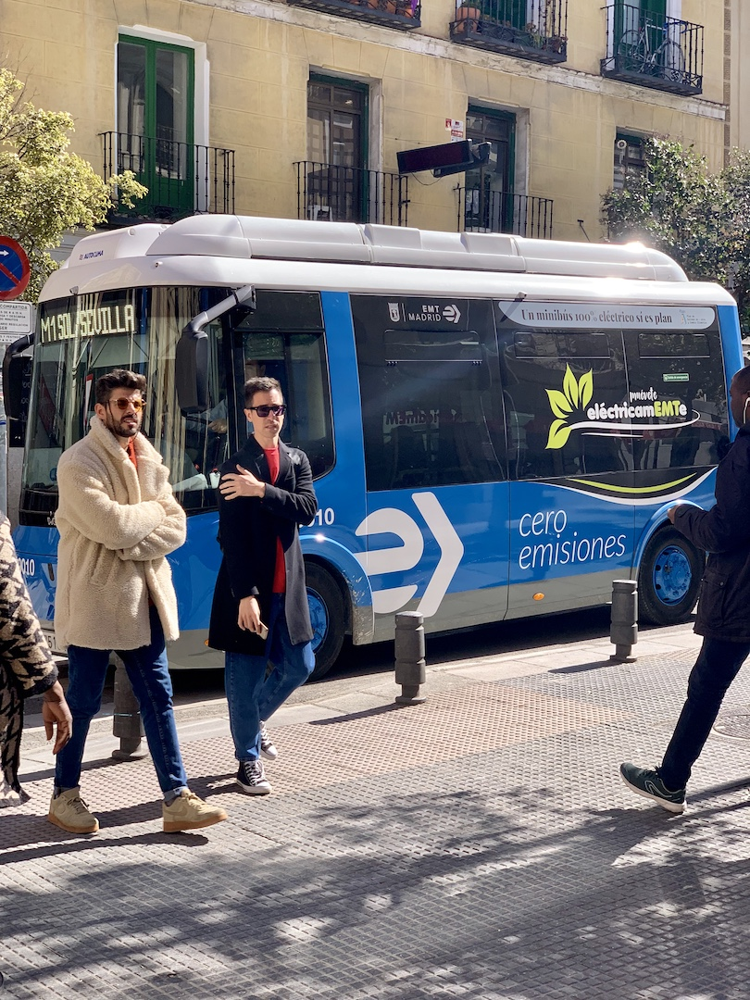

In [ ]:
Image(filename = 'data/images/bus.jpg', width=500)

In [2]:
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source data/images/

detect: weights=['yolov5s.pt'], source=data/images/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-153-gff6a9ac Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

100% 14.1M/14.1M [00:00<00:00, 354MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
image 1/2 /content/yolov5/data/images/bus.jpg: 640x480 4 persons, 1 bus, 42.3ms
image 2/2 /content/yolov5/data/images/zidane.jpg: 384x640 2 persons, 2 ties, 44.6ms
Speed: 0.5ms pre-process, 43.4ms inference, 16.9ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/de

### 데이터셋 다운로드

https://public.roboflow.com/object-detection/website-screenshots/1

In [4]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="7yG7W8f44jPwKdwmhEae")
project = rf.workspace("vaishnavi-kamdi-ariik").project("vins-apswh")
dataset = project.version(2).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.2/56.2 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 5.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 9.1 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9676 sha256=459509806e4d854f07a06e47eaa575e6a46c4bbc01ead066bcc8983c128db717
  Stored in directory: /root/.cache/pip/wheels/04/5f/3e/46cc37c5d698415694d83f607f833f83f0149e49b3af9d0f38
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.9
    Uninstalling pyparsing-3.0.9:
      Successfully uninstalled pyparsing-3.0.9
  Attempting uninstall: idna
    Found existing installation: idna 3.4
    Uninstalling idna-3.4:
    

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to VINS-2 in yolov5pytorch:: 100%|██████████| 5622/5622 [00:01<00:00, 5016.55it/s]


In [5]:
from glob import glob

train_img_list = glob('/content/yolov5/VINS-2/train/images/*.jpg')
test_img_list = glob('/content/yolov5/VINS-2/test/images/*.jpg')
valid_img_list = glob('/content/yolov5/VINS-2/valid/images/*.jpg')

print(len(train_img_list),len(test_img_list),len(valid_img_list))

1965 280 560


In [ ]:
import yaml

with open('/content/yolov5/website-screenshots/train.txt','w') as f :
  f.write('\n'.join(train_img_list)+'\n')

with open('/content/yolov5/website-screenshots/test.txt','w') as f :
  f.write('\n'.join(test_img_list)+'\n')

with open('/content/yolov5/website-screenshots/valid.txt','w') as f :
  f.write('\n'.join(valid_img_list)+'\n')

In [6]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
  with open(line,'w') as f:
    f. write(cell.format(**globals()))

In [9]:
%cat /content/yolov5/VINS-2/data.yaml


names:
- BackgroundImage
- Bottom_Navigation
- Card
- CheckBox
- Checkbox
- CheckedTextView
- Drawer
- EditText
- Icon
- Image
- Modal
- Multi_Tab
- PageIndicator
- Remember
- Spinner
- Switch
- Text
- TextButton
- Toolbar
- UpperTaskBar

nc: 20

roboflow:
  license: CC BY 4.0
  project: vins-apswh
  url: https://universe.roboflow.com/vaishnavi-kamdi-ariik/vins-apswh/dataset/2
  version: 2
  workspace: vaishnavi-kamdi-ariik

test: /content/yolov5/VINS-2/test/images
train: /content/yolov5/VINS-2/train/images
val: /content/yolov5/VINS-2/valid/images


In [8]:
%%writetemplate /content/yolov5/VINS-2/data.yaml

names:
- BackgroundImage
- Bottom_Navigation
- Card
- CheckBox
- Checkbox
- CheckedTextView
- Drawer
- EditText
- Icon
- Image
- Modal
- Multi_Tab
- PageIndicator
- Remember
- Spinner
- Switch
- Text
- TextButton
- Toolbar
- UpperTaskBar

nc: 20

roboflow:
  license: CC BY 4.0
  project: vins-apswh
  url: https://universe.roboflow.com/vaishnavi-kamdi-ariik/vins-apswh/dataset/2
  version: 2
  workspace: vaishnavi-kamdi-ariik

test: /content/yolov5/VINS-2/test/images
train: /content/yolov5/VINS-2/train/images
val: /content/yolov5/VINS-2/valid/images

In [10]:
%cat /content/yolov5/VINS-2/data.yaml


names:
- BackgroundImage
- Bottom_Navigation
- Card
- CheckBox
- Checkbox
- CheckedTextView
- Drawer
- EditText
- Icon
- Image
- Modal
- Multi_Tab
- PageIndicator
- Remember
- Spinner
- Switch
- Text
- TextButton
- Toolbar
- UpperTaskBar

nc: 20

roboflow:
  license: CC BY 4.0
  project: vins-apswh
  url: https://universe.roboflow.com/vaishnavi-kamdi-ariik/vins-apswh/dataset/2
  version: 2
  workspace: vaishnavi-kamdi-ariik

test: /content/yolov5/VINS-2/test/images
train: /content/yolov5/VINS-2/train/images
val: /content/yolov5/VINS-2/valid/images


## 모델 구성

In [12]:
import yaml

with open("/content/yolov5/VINS-2/data.yaml",'r') as stream:
  num_classes = str(yaml.safe_load(stream)['nc'])
 
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]

In [13]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# Parameters
nc: {num_classes} # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [14]:
%cat /content/yolov5/models/custom_yolov5s.yaml


# Parameters
nc: 20 # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, Fa

In [23]:
%%time 
%cd /content/yolov5/
!python train.py --img 640 --batch 32 --epochs 100 --data  /content/yolov5/VINS-2/data.yaml --cfg /content/yolov5/models/custom_yolov5s.yaml --weights '' --name results --cache

/content/yolov5
train: weights=, cfg=/content/yolov5/models/custom_yolov5s.yaml, data=/content/yolov5/VINS-2/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-153-gff6a9ac Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bi

In [24]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [27]:
!ls runs/train/results2

confusion_matrix.png				    results.png
events.out.tfevents.1682334304.156a49e1fe6d.4807.0  train_batch0.jpg
F1_curve.png					    train_batch1.jpg
hyp.yaml					    train_batch2.jpg
labels_correlogram.jpg				    val_batch0_labels.jpg
labels.jpg					    val_batch0_pred.jpg
opt.yaml					    val_batch1_labels.jpg
P_curve.png					    val_batch1_pred.jpg
PR_curve.png					    val_batch2_labels.jpg
R_curve.png					    val_batch2_pred.jpg
results.csv					    weights


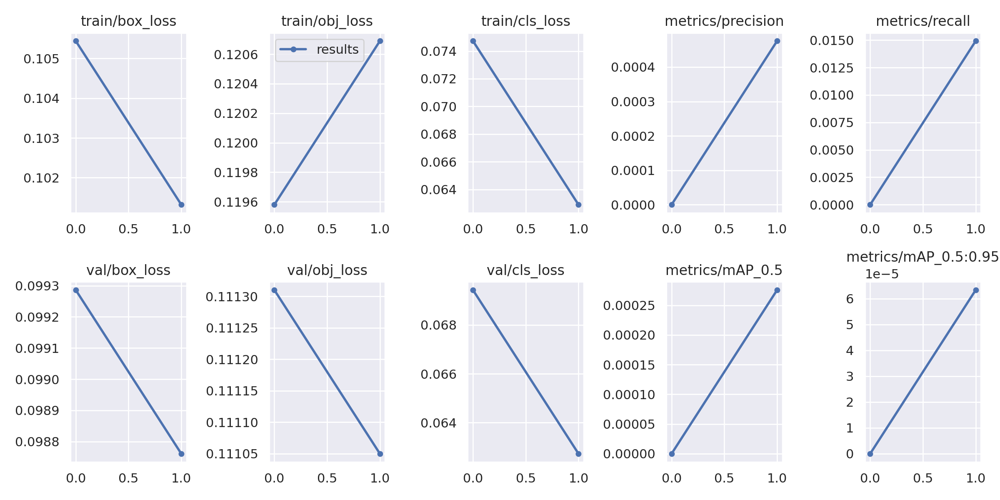

In [17]:
Image(filename='/content/yolov5/runs/train/results/results.png',width = 1000)

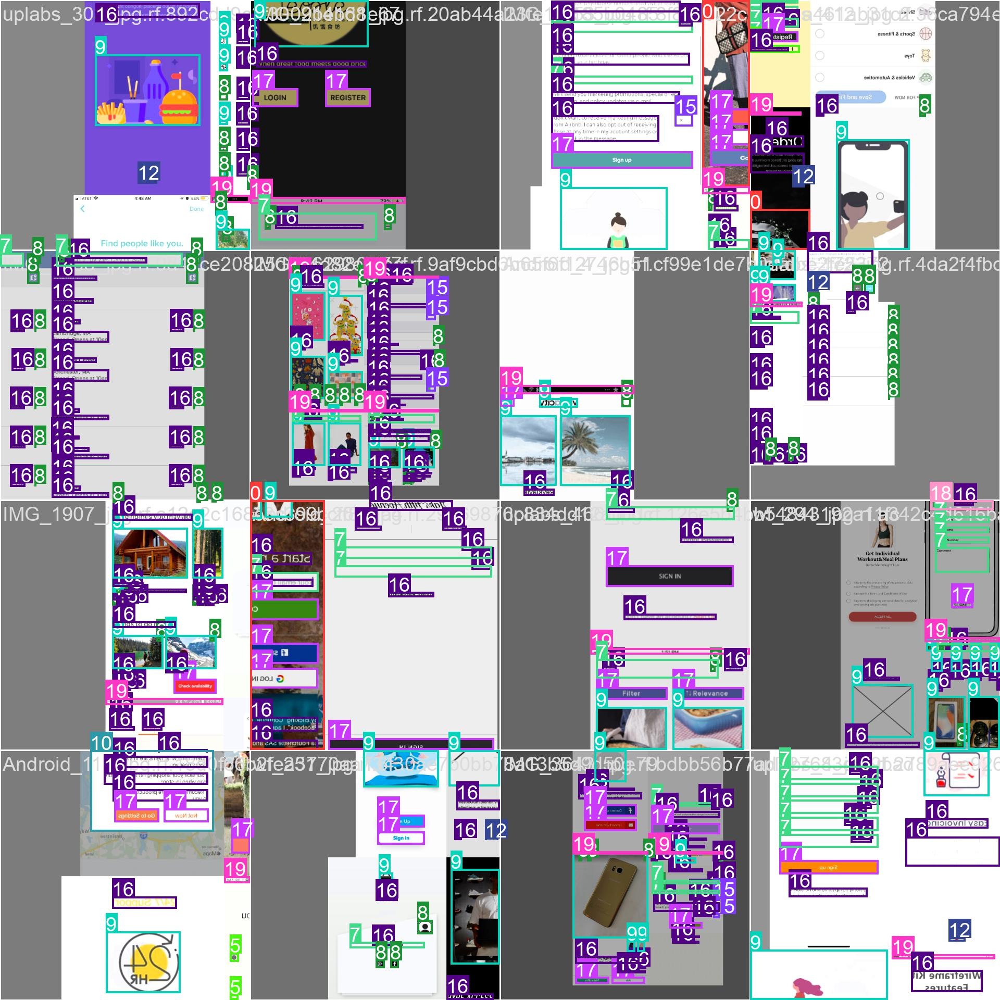

In [18]:
Image(filename='/content/yolov5/runs/train/results/train_batch0.jpg',width = 1000)

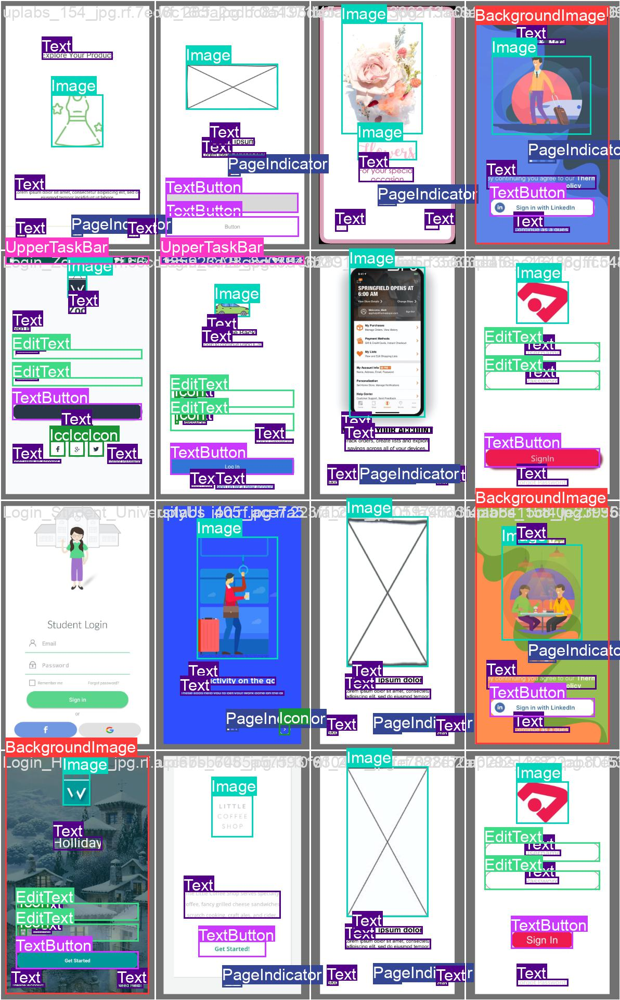

In [19]:
Image(filename='/content/yolov5/runs/train/results/val_batch0_labels.jpg',width = 1000)

In [28]:
!python val.py --weights /content/yolov5/runs/train/results2/weights/best.pt --data /content/yolov5/VINS-2/data.yaml --img 640 --iou 0.65 --half

val: data=/content/yolov5/VINS-2/data.yaml, weights=['/content/yolov5/runs/train/results2/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.65, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-153-gff6a9ac Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7064065 parameters, 0 gradients, 15.9 GFLOPs
val: Scanning /content/yolov5/VINS-2/valid/labels.cache... 560 images, 5 backgrounds, 0 corrupt: 100% 560/560 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 18/18 [00:17<00:00,  1.01it/s]
                   all        560       8345      0.844      0.484      0.575      0.443
       Backg

In [ ]:
%ls /content/yolov5/runs/train/results2/weights

In [29]:
!python detect.py --weight /content/yolov5/runs/train/results2/weights/best.pt --img 640 --conf 0.4 --source /content/yolov5/VINS-2/test/images --save-txt

detect: weights=['/content/yolov5/runs/train/results2/weights/best.pt'], source=/content/yolov5/VINS-2/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-153-gff6a9ac Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7064065 parameters, 0 gradients, 15.9 GFLOPs
image 1/280 /content/yolov5/VINS-2/test/images/Android_100_jpg.rf.750f94632b4a8874b8ae2bfae6324067.jpg: 640x384 1 Icon, 1 Text, 1 TextButton, 1 UpperTaskBar, 42.2ms
image 2/280 /content/yolov5/VINS-2/test/images/Android_106_jpg.rf.a6f007a2

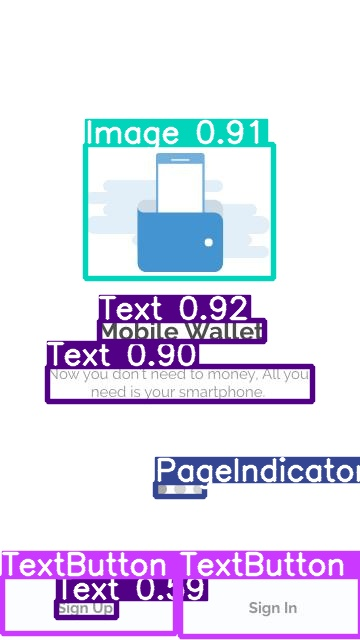

In [32]:
import glob
import random
from IPython.display import Image, display

image_name = random.choice(glob.glob('/content/yolov5/runs/detect/exp3/*.jpg'))
display(Image(filename = image_name))

In [34]:
!python detect.py --weight  /content/yolov5/runs/train/results2/weights/best.pt --img 2400 --conf 0.4 --save-txt --source /content/TEST

detect: weights=['/content/yolov5/runs/train/results2/weights/best.pt'], source=/content/TEST, data=data/coco128.yaml, imgsz=[2400, 2400], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /content/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-153-gff6a9ac Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7064065 parameters, 0 gradients, 15.9 GFLOPs
image 1/12 /content/TEST/Screenshot_20220119-164846_Phone.jpg: 2400x1088 8 Icons, 9 Images, 8 Texts, 55.0ms
image 2/12 /content/TEST/Screenshot_20220125-143821_Call settings.jpg: 2400x1088 5 Icons, 8 Images, 6 Texts, 37.3ms
image 3/12 /content/TEST/Screensho

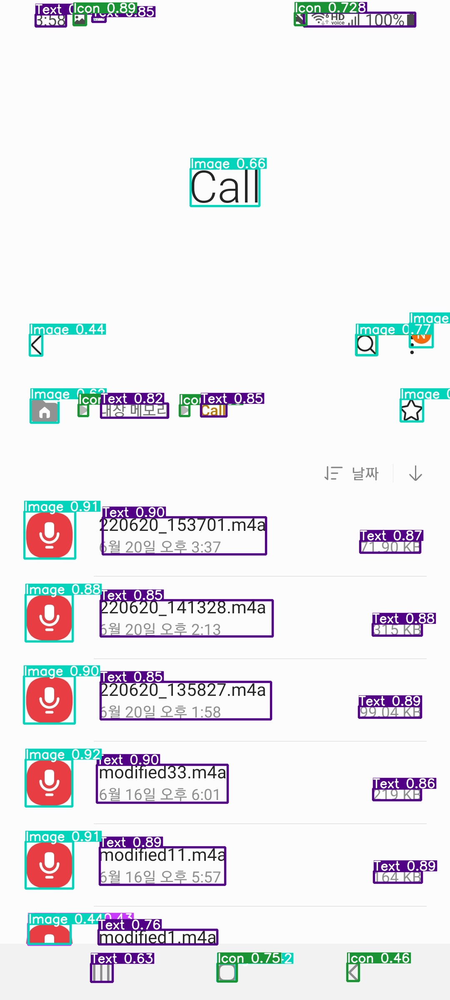

In [39]:
image_name = random.choice(glob.glob('/content/yolov5/runs/detect/exp4/*.jpg'))

display(Image(filename = image_name))

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cp /content/yolov5/runs/train/website_screenshot_results2/weights/best.pt /content/drive/MyDrive/website_screenshots